# Sat-Xception


To better detect schools on a large geospatial scale, we create a deep learning python package called `Sat-Xception`. 


Sat-Xception is a deep learning python package that utilizes pre-trained models from ImageNet. The model is designed to help our partners to quickly transfer-learn and fine-tune image classification deep learning quickly with their customized images. 

Besides a pre-train Xception neural net, we include another light-weighted pre-trained model, called MobileNet version 2, in this python package. 

MobileNetV2 is a model that is slightly less accurate compared to Xception. However, it's a very light-weight, fast, and it's easy to tune for resources vs. accuracy. 

We have two pre-trained models in `Sat-Xception`: 
- 1) [Xception](https://arxiv.org/abs/1610.02357); 
- 2) [MobileNetV2](https://ai.googleblog.com/2018/04/mobilenetv2-next-generation-of-on.html). 

![Deep Neural Net performance and the weight](figures/DCNNs.jpeg)

Xception model and MobileNetV2 were released by Google in 2016 and 2018 respectively. Both models have fewer parameters (lighter weighted) compare to other existing pre-trained models (see above image) but they have achieved high accuracy with training on ImageNet. 

And MobileNetV2 can potentially train, transfer-learn and fine-tune client's images on mobile phones.

# The Second iteration

## 1. Sat_Xception installation and fine tune

### Sat_Xception installation

#### *Currently the package has only been tested on python version 3.6.3.*  


To install `sat-xception` , transfer-learn and fine tune an image classification model, you need to:

- set up an python environment using [conda to create a virtual environment](https://uoa-eresearch.github.io/eresearch-cookbook/recipe/2014/11/20/conda/) or use [pyenv](https://gist.github.com/Geoyi/f55ed54d24cc9ff1c14bd95fac21c042);

- git clone this repo;
- cd to main_model where the `sat-xception` is located;
- run `pip3 install -e .` or `pip install -e .`

In [ ]:
# under the main_model directory, install the sat-xception by
!pip install -e .

### Sat_Xception fine-tune

In [ ]:
!sat_xception train -model=xception -train=train -valid=validation

After you install Sat_Xception. Here are **three steps** that you need to go through to Train an xception or mobilenet V2 with Sat_Xception deep learning package with your own data.

- **Step 1**: get your data in this following structure;

```

└── main_model/
    ├── train/
           ├── not-school
           ├── school 
    └── validation/
           ├── not-school 
           ├── school 
```
- **Step 2**: edit the class weight, loss function etc in the `train_config.py` under sat_xception; 

- **Step 3**: watch your tensorboard to monitor the model training. 

## 2. The second iteration of deep learning on school detection

Development Seed Data Team, a group of five expert mappers, worked on cleaning and validating school geolocations. With [clear school campus patterns in Colombia](https://paper.dropbox.com/doc/School-patterns-Colombia--ASxTzKwG7qjp7nmuI5fMTPWmAg-MaCi6NdLpkxoR8Lk4Qfrn), our expert mappers were able to confirm 10,951 schools from 44,655 given schools in Colombia from the UNICEF team.

In the first iteration, we mainly tested the model on zoom 17 (300m x 300m). The model trained with Xception model in Sat-Xception, after 40 hours of training on an AWS Deep learning AMI EC2 g2.8xlarge. The model accuracy reached 0.8.

Based on the roadmap that we learned from the first iteration, we did a few adjustments to boost the model training:

### Training dataset updates

- we used tiles in zoom 18 (152m x 152m) instead of zoom 17. In zoom 18, school pattern is more obvious, which can help our human mapper to spot school in the afterward validation; 

- we added 2,048 not-school tiles that regular included rural and urban buildings to the training dataset;

- we only kept rural schools that have very clear school patterns. In the first iteration, our trained model seemed to pick up a lot of false positive schools in rural area. Therefore, we went ahead and cleaned up rural schools. 


- The training data we have for the second iteration 

|Tasks|Confirmed | Unreconginized | not-schools| Total | Additional |
| ----| -------- | -------------- | ---------- | ----- | ---------- |
| Data Cleaning  | 10,951   | 26,638         | 7,066      | 44,655| 2nd round w/ all data|
| 2nd round tile generation  | **5,904** | N/A     | **9,092** | 14,996 | zoom 18 |

- we unbiasedly split our training dataset into `train`, `validation` and `test` by 70: 20: 10. Our model sees and learns from `train` dataset, and `validation` was used to evaluate the model, which model will see the data occasionally. `test` dataset is the dataset that never seen by the model, and it's the gold standard used to evaluate the model once the training is complete. The test dataset was used to plot the ROC curve, and it can give us a more unbiased and straight evaluation of the model performance. In the production level, we highly recommend this training dataset splitting.

In the future, when we talked about "training dataset", it refers to `train` and `validation`.

### Model training updates 

- we switch use loss function of `binary_crossentropy`, which is designed to monitor binary classification, and it's great to our "school" and "not-school" binary classification. 

- we trained both Xception and MobilenetV2 on the same training dataset. And had a pretty straight comparison between them. 

- we plot the ROC curve with `test` dataset to evaluate the models' performance, and picked the best performing model; 

### Model Inference to the national level

- we built a model inference pipe that utilized AWS lambda and SQS with Tensorflow serving image.

- The model inference performed with the best-performed model from training (see following tensorboard graphs);

- we ran the model prediction over 50.8 million image tiles (zoom 18) of Colombia plus 137, 000 tiles for a dozen of Eastern Caribbean islands;

### Machine learning prediction validation by human expert mappers

- we have our expert mapper, Development Seed Data Team, went through the model prediction (probability > 0.92) and they validate if the predicted tiles have clear school patterns. 

- During the validation, we created a few new datasets on top of machine learning prediction:
    - the expert mappers added school geolocation if they spot very obvious school pattern among the shown buildings in the tile as tag `ml_school=yes`;
    - the expert mappers add "ml_school=unrecognized" to the tiles that don't have clear school patterns;
    - the expert mapper added a tag as `ml_school=no`. 

## 3. Model performance 

As mentioned above, we trained xception and mobilenet V2 on the same training dataset. Here are the models' performance.

### Xception with Zoom18 

![tensorboard-z18-accuracy.png](figures/tensorboard-z18-accuracy.png)

![tensorboard-val-accuracy-z18.png](figures/tensorboard-val-accuracy-z18.png)

![tensorboard-loss-zoom18.png](figures/tensorboard-loss-zoom18.png)

![roc_0205_201435.png](figures/roc_0205_201435.png)

- **The curent accuracy approached 0.9 with validation accuracy to 0.88.**

- **The False positive rate is 9%**

- **The suggested threshold is 0.44**

We picked a best performance model and exported as a Tensorflow Serving image. Here we wrote [a detailed walkthrough blog](https://medium.com/devseed/technical-walkthrough-packaging-ml-models-for-inference-with-tf-serving-2a50f73ce6f8) on Medium how to export your best performing model into a Tensorflow serving image.

## 4. Model inference

We picked the best performing model and turn it into a Tensorflow serving images that now lives on [our Dockerhub](https://cloud.docker.com/u/geoyi/repository/docker/geoyi/2nd_sat_xception_tf-serving_gpu). You can pull and run the docker image at your local machine by `docker run -p 8501:8501 -t geoyi/2nd_sat_xception_tf-serving_cpu:v4` or run the GPU version on a EC2 machine, e.p. P3.x2large, by `docker run -p 8501:8501 -t geoyi/2nd_sat_xception_tf-serving_gpu:v4`, and send image tiles to the endpoint. Again, for a detailed instruction please go through our [walkthrough blog](https://medium.com/devseed/technical-walkthrough-packaging-ml-models-for-inference-with-tf-serving-2a50f73ce6f8) on Medium.

We have **52 million image tiles**, zoom 18, cover Colombia and a dozen Carribean islands. To be able to run a large scale model inference, over the 50 + millions images, we built our own model inference pipeline that utilizes AWS lambda function, ECS and SQS. The pipeline can run the machine learning prediction at a pace of 500 image tiles per second.

## 5. Machine learning prediction validation

After run the large scale model inference over the 52 millions tiles, our model inference pipeline saved a **2.2 GB** CSV that has every single tile's predcition and the confidence score if a tile contains school. 

Five of our expert mapper, Development Seed Data Team, went through the predicted tiles with predicted school confidence score > 0.92. The validated the result at the pace of **10,000 tiles per day**. And it's about 250 predicted tiles per hour per mapper.

| Total tiles reviewed   | 73, 717 |
| ---------------------- | ------- |
| ml_school yes          | 12,250  |
| ml_school points yes   | 10,998  |
| ml_school unrecognized | 60,568  |
| ml_school no           | 899     |

In the end, we reviewed 73,717 predicted tiles, and added **10,998** schools to Colombia and the esten Carribbeans. 

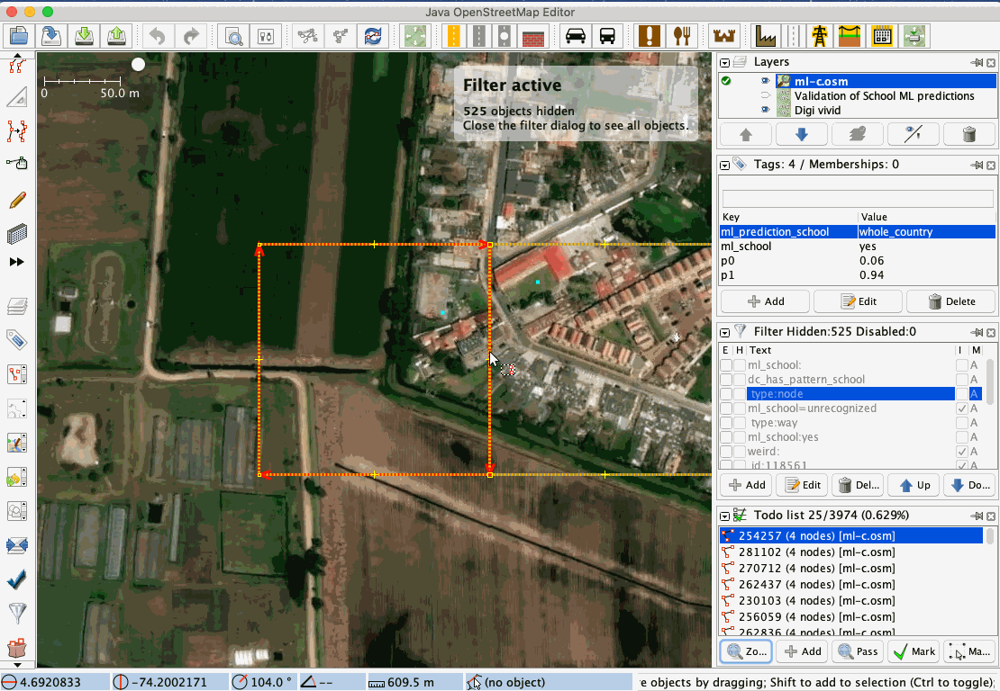

In [12]:
from IPython.display import Image
with open('./figures/m20.gif','rb') as f:
    display(Image(data=f.read(), format='png'))

### In the end, we added 6,954 new and unmapped school to Colombia, and 262 missing schools to the eastern Caribbean islands.